In [186]:
# Useful libraries

import cupy as cp # type: ignore
import numpy as np # use this library to use general numpy features
from numba import njit # use this library to 

import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from matplotlib import rc
rc('animation', html='jshtml')
import matplotlib as mpl
mpl.rcParams['animation.embed_limit'] = 100  # MB

In [ ]:
# Physical constants
elem_charge = 1.602176634e-19 # in C
electron_mass = 9.109383713928e-31 # in kg
eps0 = 8.854187818814e-12 # in F ^{-1}
lightspeed = 299792458 # in m / s
planck = 6.62607015e-34 # in Js
reduced_planck = planck / (2 * np.pi) # in Js

# Constants of the laser
lam = 775e-9 # central wavelength of the pulse in m
wavenumber = 2 * np.pi / lam # central wavenumber of the pulse in m^{-1}
omega = wavenumber * lightspeed
waist = 0.7e-3 # even though the geometry is cartesian, I am still taking the beam waist to be a relevant geomtrical parameter for length scales, in m
zR = wavenumber * waist**2 / 2 # Rayleigh range relevant for the scale of the diffraction in m
tp = 85e-15 # temporal length of the pulse in vacuum in s


# Constants of the material 
nb = 1 # index of refraction of air
n2 = 5.57e-23 # in the optical Kerr effect, in m^{2} W^{-1}
ddot_k = 2.0 * (1e-15)**2 * (1e-2)**(-1) # GVD
tau = 3.5e-13 # plasma defocusing
Eg = 11 * elem_charge # ionization energy of air
a = 5e-13 # radiative electron recombination, in m^3 s 

sigma = wavenumber * elem_charge**2 * tau / (omega * electron_mass * eps0) / (1 + omega**2 * tau**2)
Pcr = lam**2 / (2 * np.pi * nb * n2) # critical power, related to the optical Kerr effect
beta_k = 6.5e-104 # MPA coefficient
# Pin = 1.557 * Pcr
Pin = 6.5 * Pcr
K = 7

In [188]:
# Space mesh, frequency mesh

xmin = -5 * waist
xmax = 5 * waist
Nx = 2000
DeltaX = (xmax - xmin) / (Nx - 1)
x_vector = cp.linspace(xmin, xmax, Nx)

kx_vector = 2 * cp.pi * cp.fft.fftfreq(Nx, d=DeltaX)

tmin = -5 * tp
tmax = 5 * tp
Nt = 2000
DeltaT = (tmax - tmin) / (Nt - 1)
t_vector = cp.linspace(tmin, tmax, Nt)

kt_vector = 2 * cp.pi * cp.fft.fftfreq(Nt, d=DeltaT)

zmin = 0
zmax = 4
Nz = 2000
DeltaZ = (zmax - zmin) / (Nz + 1)
z_vector = cp.linspace(zmin, zmax, Nz + 2)

x_matrix, t_matrix = cp.meshgrid(x_vector, t_vector, indexing='ij')

kx_matrix, kt_matrix = cp.meshgrid(kx_vector, kt_vector, indexing='ij')

In [189]:
# Define the half-step propagtore A_half

A_half = cp.exp(-0.25j / (wavenumber) * kx_matrix**2 * DeltaZ + 0.25j * ddot_k * kt_matrix**2 * DeltaZ)

In [190]:
# Low-level GPU programming inside Python via CuPY (CUDA C)

rho_kernel = cp.RawKernel(r'''
extern "C" __global__
void generate_rho(
    const double* I,
    double* rho,
    const double plasma_avalanche,
    const double plasma_MPA,
    const double DeltaT,
    const int Nx,
    const int Nt,
    const int K
){
    int ix = blockDim.x * blockIdx.x + threadIdx.x;
    if (ix >= Nx) return;

    // rho(ix,0) = 0
    rho[ix * Nt + 0] = 0.0;

    for (int k = 0; k < Nt - 1; ++k){
        double Ik = I[ix * Nt + k];
        double a = plasma_avalanche * Ik;

        // compute Ik^K
        double Ik_pow = 1.0;
        for (int j = 0; j < K; ++j){
            Ik_pow *= Ik;
        }
        double b = plasma_MPA * Ik_pow;

        double rho_k = rho[ix * Nt + k];
        double rho_next;

        if (fabs(a) > 1e-30){
            double expadt = exp(a * DeltaT);
            rho_next = rho_k * expadt + b * (expadt - 1.0) / a;
        } else {
            rho_next = rho_k + b * DeltaT;
        }

        rho[ix * Nt + (k + 1)] = rho_next;
    }
}
''', 'generate_rho')

In [191]:
# Upade the plasma density

def generates_rho(I, plasma_avalanche, plasma_MPA, DeltaT, K):
    Nx, Nt = I.shape
    rho = cp.zeros((Nx, Nt), dtype=cp.float64)

    threads = 256
    blocks = (Nx + threads - 1) // threads

    rho_kernel(
        (blocks,),
        (threads,),
        (
            I,
            rho,
            float(plasma_avalanche),
            float(plasma_MPA),
            float(DeltaT),
            Nx,
            Nt,
            K
        )
    )

    return rho

In [ ]:
"""
# Update the plasma density
plasma_avalanche = 1 / nb**2 * sigma / Eg
plasma_MPA = beta_k / (K * reduced_planck * omega)
def generates_rho(I):
    
    #Input:
    #I : intensity, 2d array, shape (Nx, Nt) 
    
    #Output:
    #Returns a 2d array, shape (Nx, Nt)
    
    # initialize rho
    rho = cp.zeros((Nx, Nt), dtype=cp.float64) # this is a 2d array of shape (Nx, Nt)
    
    # define useful 2d arrays
    avalanche = plasma_avalanche * I # this is a 2d array of shape (Nx, Nt)
    MPA = plasma_MPA * I**K # this is a 2d array of shape (Nx, Nt)
    
    # compute rho
    for k in range(0, Nt - 1): # index goes from 0 to Nt - 2
        rho[:, k + 1] = rho[:, k] * cp.exp(avalanche[:, k] * DeltaT) + MPA[:, k] / avalanche[:, k] * (-1 + cp.exp(avalanche[:, k] * DeltaT))
        
    return rho
"""

In [192]:
# Initial conditions

amp = cp.sqrt(2 * Pin / (cp.pi * waist**2))
E = amp * cp.exp(-x_matrix**2 / waist**2 - t_matrix**2/tp**2).astype(cp.complex128) # this is a 2d array
I = E.real * E.real + E.imag * E.imag


number_diag = 100
len_diag = (Nz + 1) // number_diag + 1
z_diag = np.array([zmin + m * number_diag * DeltaZ for m in range(len_diag)])

intensity_diag = np.zeros((len_diag, Nx, Nt), dtype=np.float64) # this is a 3d array
intensity_diag[0] = cp.asnumpy(I) # this is a 2d array

intensity_peak = np.zeros(len_diag, dtype=np.float64) # this is a 1d array
intensity_peak[0] = float(cp.nanmax(I).get()) # this is a number

intensity_central = np.zeros(len_diag, dtype=np.float64) # this is a 1d array
intensity_central[0] = I[Nx // 2, Nt // 2].item()

In [193]:
# Propagate the electric field using Strang split scheme

plasma_avalanche = 1 / nb**2 * sigma / Eg
plasma_MPA = beta_k / (K * reduced_planck * omega)

for n in range(1, Nz + 2):
    # half step, linear FFT
    spectrum_E = cp.fft.fft2(E)
    spectrum_E = spectrum_E * A_half
    E = cp.fft.ifft2(spectrum_E)

    # full step, nonlinear
    I = E.real * E.real + E.imag * E.imag
    rho = generates_rho(I=I, plasma_avalanche=plasma_avalanche, plasma_MPA=plasma_MPA, DeltaT=DeltaT, K=K) # this is a 2d array
    nonlinear = -0.5 * sigma * (1 + 1j * omega * tau) * rho - 0.5 * beta_k * I**(K-1) + 1j * wavenumber * n2 * I
    E = E * cp.exp(nonlinear * DeltaZ)

    # half step, linear FFT
    spectrum_E = cp.fft.fft2(E)
    spectrum_E = spectrum_E * A_half
    E = cp.fft.ifft2(spectrum_E)

    if n % number_diag == 0:
        I = E.real * E.real + E.imag * E.imag
        intensity_diag[n // number_diag] = cp.asnumpy(I)
        intensity_peak[n // number_diag] = float(cp.nanmax(I).get())
        intensity_central[n // number_diag] = I[Nx // 2, Nt // 2].item()

Text(0, 0.5, 'Relative peak intensity I / I0')

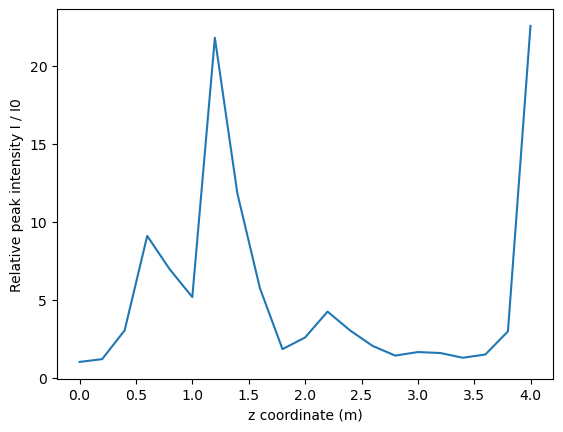

In [194]:
# Plot the diagnostics of intensity_peak

plt.plot(z_diag, intensity_peak / intensity_peak[0])
plt.xlabel('z coordinate (m)'); plt.ylabel('Relative peak intensity I / I0')

Text(0, 0.5, 'Relative central intensity I / I0')

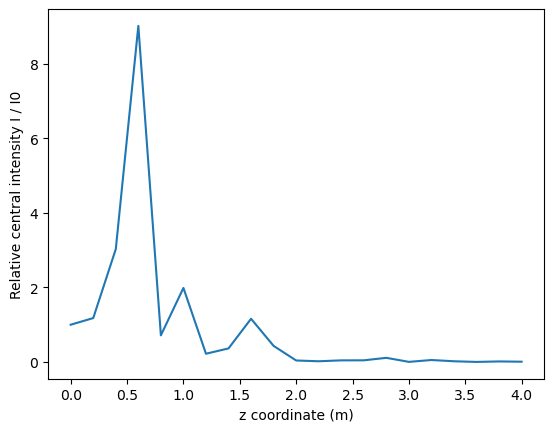

In [196]:
# Plot the diagnostics of intensity_central

plt.plot(z_diag, intensity_central / intensity_central[0])
plt.xlabel('z coordinate (m)'); plt.ylabel('Relative central intensity I / I0')

In [185]:
# Plot the diagnostics of intensity_diag

# animate it 

fig, ax = plt.subplots()

extent = [
    float(t_vector[0].get()), float(t_vector[-1].get()), # X-axis (t)
    float(x_vector[0].get()), float(x_vector[-1].get()) # Y-axis (x)
]


im = ax.imshow(
    intensity_diag[0],
    extent=extent,
    origin='lower',
    aspect='auto',
)

ax.set_xlabel('time coordinate (s)')
ax.set_ylabel('x coordinate (m)')
ax.set_title('Intensity at z = 0')

cbar = plt.colorbar(im, ax=ax)
cbar.set_label('Intensity')

def animate(i):
    # if intensity_diag is GPU → convert:
    # frame = cp.asnumpy(intensity_diag[i])
    
    frame = intensity_diag[i]
    
    vmin = np.percentile(frame, 1)
    vmax = np.percentile(frame, 100)

    im.set_data(frame)
    im.set_clim(vmin, vmax)
    
    cbar.update_normal(im)
    

    ax.set_title(f'z = {round(z_diag[i], 3)} m')
    return [im]

ani = FuncAnimation(
    fig,
    animate,
    frames=intensity_diag.shape[0],
    interval=100,
    blit=True   
)

plt.close(fig)
ani

In [118]:
# Now I have to check corectness of the code against already existing analytic solutions in simple cases

# Physical constants
elem_charge = 1.602176634e-19 # in C
electron_mass = 9.109383713928e-31 # in kg
eps0 = 8.854187818814e-12 # in F ^{-1}
lightspeed = 299792458 # in m / s
planck = 6.62607015e-34 # in Js
reduced_planck = planck / (2 * np.pi) # in Js

# Constants of the laser
lam = 775e-9 # central wavelength of the pulse in m
wavenumber = 2 * np.pi / lam # central wavenumber of the pulse in m^{-1}
omega = wavenumber * lightspeed
waist = 0.7e-3 # even though the geometry is cartesian, I am still taking the beam waist to be a relevant geomtrical parameter for length scales, in m
zR = wavenumber * waist**2 / 2 # Rayleigh range relevant for the scale of the diffraction in m
tp = 85e-15 # temporal length of the pulse in vacuum in s


# Constants of the material 
nb = 1 # index of refraction of air
n2 = 0
ddot_k = 2.0 * (1e-15)**2 * (1e-2)**(-1) # GVD
tau = 3.5e-13 # plasma defocusing
Eg = 11 * elem_charge # ionization energy of air
a = 5e-13 # radiative electron recombination, in m^3 s 

sigma = 0
#Pcr = lam**2 / (2 * np.pi * nb * n2) # critical power, related to the optical Kerr effect
Pcr = 1.7e9
beta_k = 0
# Pin = 1.557 * Pcr
Pin = 6.5 * Pcr
K = 7

In [119]:
# Space mesh, frequency mesh

xmin = -5 * waist
xmax = 5 * waist
Nx = 1000
DeltaX = (xmax - xmin) / (Nx - 1)
x_vector = cp.linspace(xmin, xmax, Nx)

kx_vector = 2 * cp.pi * cp.fft.fftfreq(Nx, d=DeltaX)

tmin = -5 * tp
tmax = 5 * tp
Nt = 1000
DeltaT = (tmax - tmin) / (Nt - 1)
t_vector = cp.linspace(tmin, tmax, Nt)

kt_vector = 2 * cp.pi * cp.fft.fftfreq(Nt, d=DeltaT)

zmin = 0
zmax = 4
Nz = 1000
DeltaZ = (zmax - zmin) / (Nz + 1)
z_vector = cp.linspace(zmin, zmax, Nz + 2)

x_matrix, t_matrix = cp.meshgrid(x_vector, t_vector, indexing='ij')

kx_matrix, kt_matrix = cp.meshgrid(kx_vector, kt_vector, indexing='ij')

In [120]:
# Define the half-step propagtore A_half

A_half = cp.exp(-0.25j / (wavenumber) * kx_matrix**2 * DeltaZ + 0.25j * ddot_k * kt_matrix**2 * DeltaZ)

In [121]:
# Low-level GPU programming inside Python via CuPY (CUDA C)

rho_kernel = cp.RawKernel(r'''
extern "C" __global__
void generate_rho(
    const double* I,
    double* rho,
    const double plasma_avalanche,
    const double plasma_MPA,
    const double DeltaT,
    const int Nx,
    const int Nt,
    const int K
){
    int ix = blockDim.x * blockIdx.x + threadIdx.x;
    if (ix >= Nx) return;

    // rho(ix,0) = 0
    rho[ix * Nt + 0] = 0.0;

    for (int k = 0; k < Nt - 1; ++k){
        double Ik = I[ix * Nt + k];
        double a = plasma_avalanche * Ik;

        // compute Ik^K
        double Ik_pow = 1.0;
        for (int j = 0; j < K; ++j){
            Ik_pow *= Ik;
        }
        double b = plasma_MPA * Ik_pow;

        double rho_k = rho[ix * Nt + k];
        double rho_next;

        if (fabs(a) > 1e-30){
            double expadt = exp(a * DeltaT);
            rho_next = rho_k * expadt + b * (expadt - 1.0) / a;
        } else {
            rho_next = rho_k + b * DeltaT;
        }

        rho[ix * Nt + (k + 1)] = rho_next;
    }
}
''', 'generate_rho')

In [122]:
# Upade the plasma density

def generates_rho(I, plasma_avalanche, plasma_MPA, DeltaT, K):
    Nx, Nt = I.shape
    rho = cp.zeros((Nx, Nt), dtype=cp.float64)

    threads = 256
    blocks = (Nx + threads - 1) // threads

    rho_kernel(
        (blocks,),
        (threads,),
        (
            I,
            rho,
            float(plasma_avalanche),
            float(plasma_MPA),
            float(DeltaT),
            Nx,
            Nt,
            K
        )
    )

    return rho

In [123]:
# Initial conditions

amp = cp.sqrt(2 * Pin / (cp.pi * waist**2))
E = amp * cp.exp(-x_matrix**2 / waist**2 - t_matrix**2/tp**2).astype(cp.complex128) # this is a 2d array
I = E.real * E.real + E.imag * E.imag


number_diag = 10
len_diag = (Nz + 1) // number_diag + 1
z_diag = np.array([zmin + m * number_diag * DeltaZ for m in range(len_diag)])

intensity_diag = np.zeros((len_diag, Nx, Nt)) # this is a 3d array
intensity_diag[0] = cp.asnumpy(I) # this is a 2d array

intensity_peak = np.zeros(len_diag) # this is a 1d array
intensity_peak[0] = float(cp.nanmax(I).get()) # this is a number

In [124]:
# Propagate the electric field using Strang split scheme

plasma_avalanche = 1 / nb**2 * sigma / Eg
plasma_MPA = beta_k / (K * reduced_planck * omega)

for n in range(1, Nz + 2):
    # half step, linear FFT
    spectrum_E = cp.fft.fft2(E)
    spectrum_E = spectrum_E * A_half
    E = cp.fft.ifft2(spectrum_E)

    # full step, nonlinear
    I = E.real * E.real + E.imag * E.imag
    rho = generates_rho(I=I, plasma_avalanche=plasma_avalanche, plasma_MPA=plasma_MPA, DeltaT=DeltaT, K=K) # this is a 2d array
    nonlinear = -0.5 * sigma * (1 + 1j * omega * tau) * rho - 0.5 * beta_k * I**(K-1) + 1j * wavenumber * n2 * I
    E = E * cp.exp(nonlinear * DeltaZ)

    # half step, linear FFT
    spectrum_E = cp.fft.fft2(E)
    spectrum_E = spectrum_E * A_half
    E = cp.fft.ifft2(spectrum_E)

    if n % number_diag == 0:
        I = E.real * E.real + E.imag * E.imag
        intensity_diag[n // number_diag] = cp.asnumpy(I)
        intensity_peak[n // number_diag] = float(cp.nanmax(I).get())

Text(0, 0.5, 'Relative peak intensity I / I0')

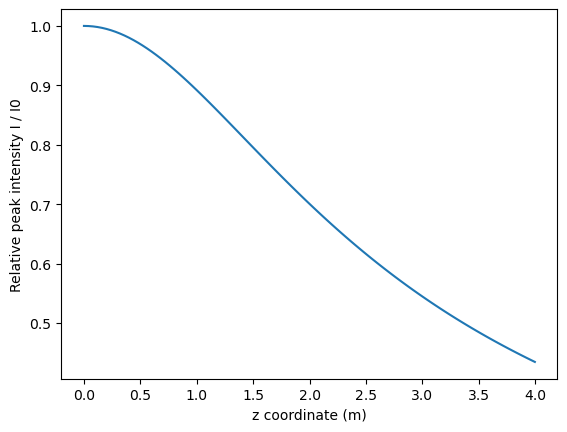

In [125]:
# Plot the diagnostics of intensity_central

plt.plot(z_diag, intensity_peak / intensity_peak[0])
plt.xlabel('z coordinate (m)'); plt.ylabel('Relative peak intensity I / I0')

In [126]:
fig2, ax2 = plt.subplots()

extent = [
    float(t_vector[0].get()), float(t_vector[-1].get()), # X-axis (t)
    float(x_vector[0].get()), float(x_vector[-1].get()) # Y-axis (x)
]


im = ax2.imshow(
    intensity_diag[0],
    extent=extent,
    origin='lower',
    aspect='auto',
)

ax2.set_xlabel('time coordinate (s)')
ax2.set_ylabel('x coordinate (m)')
ax2.set_title('Intensity at z = 0')

cbar = plt.colorbar(im, ax=ax2)
cbar.set_label('Intensity')

def animate(i):
    # if intensity_diag is GPU → convert:
    # frame = cp.asnumpy(intensity_diag[i])
    
    frame = intensity_diag[i]
    
    vmin = np.percentile(frame, 1)
    vmax = np.percentile(frame, 100)

    im.set_data(frame)
    im.set_clim(vmin, vmax)
    
    cbar.update_normal(im)
    

    ax.set_title(f'z = {round(z_diag[i], 3)} m')
    return [im]

ani = FuncAnimation(
    fig2,
    animate,
    frames=intensity_diag.shape[0],
    interval=100,
    blit=True   
)

plt.close(fig2)
ani

In [132]:
# exact solution

intensity_exact = cp.zeros((len_diag, Nx, Nt), dtype=cp.float64)
intensity_exact_peak = np.zeros(len_diag, dtype=np.float64)
for n in range(len_diag):
    zt = tp**2 / ddot_k
    number_x = np.sqrt(1 + z_diag[n]**2 / zR**2)
    number_t = np.sqrt(1 + z_diag[n]**2 / zt**2)
    intensity_exact[n] = amp**2 / number_x / number_t * cp.exp(-2 * x_matrix**2 / waist**2 / number_x**2) * cp.exp(-2 * t_matrix**2 / waist**2 / number_t**2)
    intensity_exact_peak[n] = float(cp.nanmax(intensity_exact[n]))

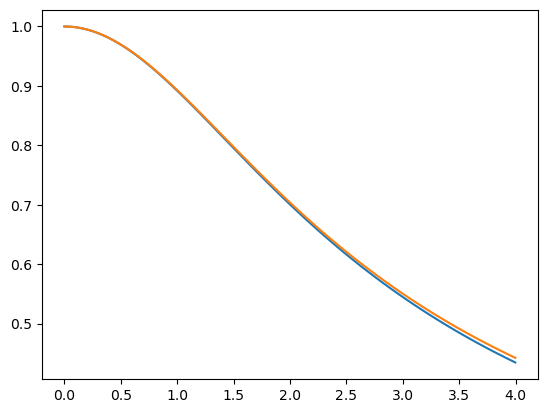

In [134]:
plt.plot(z_diag, intensity_peak / intensity_peak[0])
plt.plot(z_diag, intensity_exact_peak / intensity_exact_peak[0])